# Finance and Risk Analytics Capstone

### Importing the packages

In [3]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.arima_model import ARIMA
from prophet import Prophet
from pypfopt import EfficientFrontier, risk_models, expected_returns


# Data display customization
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)

# Suppress Warnings
import warnings
warnings.filterwarnings('ignore')

### Loading the data

#### 1. Aviation Data :

In [4]:
AAL  = pd.read_csv('AAL.csv', parse_dates=['Date'], dayfirst=True)
ALGT = pd.read_csv('ALGT.csv', parse_dates=['Date'], dayfirst=True)
ALK  = pd.read_csv('ALK.csv', parse_dates=['Date'], dayfirst=True)
DAL  = pd.read_csv('DAL.csv', parse_dates=['Date'], dayfirst=True)
HA   = pd.read_csv('HA.csv', parse_dates=['Date'], dayfirst=True)
LUV  = pd.read_csv('LUV.csv', parse_dates=['Date'], dayfirst=True)

#### 2. Finance Data :

In [5]:
BCS  = pd.read_csv('BCS.csv', parse_dates=['Date'], dayfirst=True)
CS   = pd.read_csv('CS.csv', parse_dates=['Date'], dayfirst=True)
DB   = pd.read_csv('DB.csv', parse_dates=['Date'], dayfirst=True)
GS   = pd.read_csv('GS.csv', parse_dates=['Date'], dayfirst=True)
MS   = pd.read_csv('MS.csv', parse_dates=['Date'], dayfirst=True)
WFC  = pd.read_csv('WFC.csv', parse_dates=['Date'], dayfirst=True)

#### 3.  Pharma_Healthcare Data:

In [6]:
BHC   = pd.read_csv('BHC.csv', parse_dates=['Date'], dayfirst=True)
JNJ   = pd.read_csv('JNJ.csv', parse_dates=['Date'], dayfirst=True)
MRK   = pd.read_csv('MRK.csv', parse_dates=['Date'], dayfirst=True)
PFE   = pd.read_csv('PFE.csv', parse_dates=['Date'], dayfirst=True)
RHHBY = pd.read_csv('RHHBY.csv', parse_dates=['Date'], dayfirst=True)
UNH   = pd.read_csv('UNH.csv', parse_dates=['Date'], dayfirst=True)

#### 4. Technology Data:

In [7]:
AAPL  = pd.read_csv('AAPL.csv', parse_dates=['Date'], dayfirst=True)
AMZN  = pd.read_csv('AMZN.csv', parse_dates=['Date'], dayfirst=True)
FB    = pd.read_csv('FB.csv', parse_dates=['Date'], dayfirst=True)
GOOG  = pd.read_csv('GOOG.csv', parse_dates=['Date'], dayfirst=True)
IBM   = pd.read_csv('IBM.csv', parse_dates=['Date'], dayfirst=True)
MSFT  = pd.read_csv('MSFT.csv', parse_dates=['Date'], dayfirst=True)

#### S&P 500 Data:

In [8]:
SP500  = pd.read_csv('S&P500.csv', parse_dates=['Date'], dayfirst=True)

#### Annexure Data:

In [9]:
Annex = pd.read_csv("Annexure-I.csv", delimiter=',', header=None, skiprows=1, names=['Ticker','Industry','Company Name'])

## Merging Stocks to one Dataframe
Closing price of stock is taken as daily stock price

In [10]:
stock_list=[AAL,ALGT,ALK,DAL,HA,LUV,
        BCS,CS,DB,GS,MS,WFC,
        BHC,JNJ,MRK,PFE,RHHBY,UNH,
        AAPL,AMZN,FB,GOOG,IBM,MSFT,
         SP500]

In [11]:
tickers=['AAL','ALGT','ALK','DAL','HA','LUV',
        'BCS','CS','DB','GS','MS','WFC',
        'BHC','JNJ','MRK','PFE','RHHBY','UNH',
        'AAPL','AMZN','FB','GOOG','IBM','MSFT',
         'SP500'
            ]

In [12]:
Stock=[]
for i, name in enumerate(tickers):
    stock_list[i]['Stock']=name
    stock_list[i].set_index('Date', inplace=True)
    temp=stock_list[i]
    Stock.append(temp)

Merging and concatinating all the stocks datasets into one single file.

In [13]:
df = pd.concat(Stock)
df = df.reset_index()
df.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Stock
0,2010-10-01,9.29,9.39,9.21,9.29,8.758067,3603800.0,AAL
1,2010-10-04,9.24,9.48,9.05,9.12,8.597802,3856800.0,AAL
2,2010-10-05,9.27,9.35,9.15,9.23,8.701504,3896600.0,AAL
3,2010-10-06,9.27,9.40,9.15,9.23,8.701504,3230200.0,AAL
4,2010-10-07,9.30,9.31,9.07,9.24,8.710930,3877700.0,AAL


### Cleaning data:

 - As we only need the closing prices of all the stocks and date for time-series analysis, dropping other columns and creating copy of the dataframe.

 - Saving the new dataframe as df_cleaned.

In [14]:
df = pd.concat(Stock)
df = df.reset_index()
df = df[['Date', 'Close', 'Stock']]
df=df.dropna()
df_cleaned = df.copy()
right=Annex[['Ticker','Industry']]
left=df_cleaned.copy()
df_cleaned=pd.merge(left, right, left_on='Stock', right_on='Ticker', how="outer")
df_cleaned.fillna("SP500", inplace = True) 
df_cleaned.drop(columns=['Ticker'],inplace=True)
df_cleaned.head()

,Date,Close,Stock,Industry
0,2010-10-01 00:00:00,9.29,AAL,Aviation
1,2010-10-04 00:00:00,9.12,AAL,Aviation
2,2010-10-05 00:00:00,9.23,AAL,Aviation
3,2010-10-06 00:00:00,9.23,AAL,Aviation
4,2010-10-07 00:00:00,9.24,AAL,Aviation


#### Checking Datatypes:

In [15]:
df_cleaned.dtypes

Date        object
Close       object
Stock       object
Industry    object
dtype: object

- Changing 'Date' from object to DateTime format

In [16]:
df_cleaned['Date'] = pd.to_datetime(df_cleaned['Date'],dayfirst=True, errors='coerce')

In [17]:
df_cleaned.dtypes

Date        datetime64[ns]
Close               object
Stock               object
Industry            object
dtype: object

- Changing the format of dataframe for better analysis:

In [18]:
df_cleaned=df.pivot('Date','Stock','Close').reset_index()
df_cleaned

Stock,Date,AAL,AAPL,ALGT,ALK,AMZN,BCS,BHC,CS,DAL,DB,FB,GOOG,GS,HA,IBM,JNJ,LUV,MRK,MS,MSFT,PFE,RHHBY,SP500,UNH,WFC
0,2010-01-04,NaN,NaN,NaN,NaN,NaN,16.894009,NaN,50.771484,NaN,69.875954,NaN,NaN,173.080002,NaN,NaN,NaN,NaN,NaN,30.910000,NaN,NaN,NaN,NaN,NaN,27.320000
1,2010-01-05,NaN,NaN,NaN,NaN,NaN,17.824884,NaN,51.191406,NaN,71.211830,NaN,NaN,176.139999,NaN,NaN,NaN,NaN,NaN,32.040001,NaN,NaN,NaN,NaN,NaN,28.070000
2,2010-01-06,NaN,NaN,NaN,NaN,NaN,18.129032,NaN,50.478516,NaN,69.980919,NaN,NaN,174.259995,NaN,NaN,NaN,NaN,NaN,32.450001,NaN,NaN,NaN,NaN,NaN,28.110001
3,2010-01-07,NaN,NaN,NaN,NaN,NaN,18.801844,NaN,52.519531,NaN,70.772903,NaN,NaN,177.669998,NaN,NaN,NaN,NaN,NaN,32.919998,NaN,NaN,NaN,NaN,NaN,29.129999
4,2010-01-08,NaN,NaN,NaN,NaN,NaN,18.967741,NaN,53.291016,NaN,73.330154,NaN,NaN,174.309998,NaN,NaN,NaN,NaN,NaN,32.250000,NaN,NaN,NaN,NaN,NaN,28.860001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2700,2020-09-24,11.77,108.220001,121.500000,35.700001,3019.790039,4.750000,15.22,9.620000,29.010000,8.110000,249.529999,1428.290039,195.110001,12.40,118.089996,144.669998,36.860001,83.150002,46.610001,203.190002,35.759998,44.700001,3246.590088,292.660004,23.320000
2701,2020-09-25,12.29,112.279999,123.760002,36.700001,3095.129883,4.700000,15.30,9.480000,29.780001,8.000000,254.820007,1444.959961,194.949997,12.80,118.949997,145.660004,37.099998,82.930000,47.040001,207.820007,36.049999,44.820000,3298.459961,302.500000,23.639999
2702,2020-09-28,12.76,114.959999,127.110001,37.540001,3174.050049,4.990000,15.27,9.900000,31.340000,8.430000,256.820007,1464.520020,199.070007,13.38,121.730003,147.110001,38.240002,82.760002,48.380001,209.440002,36.389999,44.110001,3351.600098,303.230011,23.820000
2703,2020-09-29,12.25,114.089996,121.089996,36.669998,3144.879883,4.960000,14.88,9.830000,30.610001,8.270000,261.790009,1469.329956,196.789993,12.86,120.940002,147.059998,37.610001,81.900002,47.240002,207.259995,36.169998,43.369999,3335.469971,304.149994,23.260000


- For portfolio creation, we only need data for the last five years i.e. from 2015 to 2020, we are removing the data prior to 2015.

In [19]:
start_date = '2015-09-30'
end_date = '2020-09-30'

In [20]:
dates = (df_cleaned['Date'] > start_date) & (df_cleaned['Date'] <= end_date)

In [21]:
df_cleaned = df_cleaned.loc[dates]
df_cleaned

Stock,Date,AAL,AAPL,ALGT,ALK,AMZN,BCS,BHC,CS,DAL,DB,FB,GOOG,GS,HA,IBM,JNJ,LUV,MRK,MS,MSFT,PFE,RHHBY,SP500,UNH,WFC
1446,2015-10-01,39.200001,27.395000,217.979996,80.230003,520.719971,15.01,179.600006,24.090000,45.410000,26.520000,90.949997,611.289978,176.020004,24.730000,143.589996,93.169998,38.410000,49.369999,31.500000,44.610001,31.840000,33.220001,1923.819946,116.610001,51.439999
1447,2015-10-02,38.630001,27.594999,215.589996,79.260002,532.539978,15.39,182.320007,24.639999,44.869999,27.139999,92.070000,626.909973,177.009995,24.280001,144.580002,93.930000,38.380001,50.139999,31.430000,45.570000,33.080002,33.320000,1951.359985,118.830002,51.259998
1448,2015-10-05,40.189999,27.695000,216.059998,80.910004,543.679993,15.60,163.460007,25.160000,46.959999,28.200001,94.010002,641.469971,180.699997,25.500000,149.039993,94.760002,39.299999,51.230000,32.290001,46.630001,33.480000,33.439999,1987.050049,119.650002,52.410000
1449,2015-10-06,38.130001,27.827499,208.600006,74.529999,537.479980,15.55,166.000000,25.379999,45.090000,28.400000,92.800003,645.440002,180.320007,24.250000,148.779999,93.419998,38.000000,49.799999,32.360001,46.750000,32.790001,33.529999,1979.920044,116.050003,52.029999
1450,2015-10-07,39.310001,27.695000,213.839996,75.970001,541.940002,15.73,169.830002,25.320000,45.990002,28.790001,92.400002,642.359985,182.229996,24.559999,150.089996,94.980003,38.709999,50.950001,32.930000,46.799999,33.290001,32.549999,1995.829956,116.430000,52.189999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2700,2020-09-24,11.770000,108.220001,121.500000,35.700001,3019.790039,4.75,15.220000,9.620000,29.010000,8.110000,249.529999,1428.290039,195.110001,12.400000,118.089996,144.669998,36.860001,83.150002,46.610001,203.190002,35.759998,44.700001,3246.590088,292.660004,23.320000
2701,2020-09-25,12.290000,112.279999,123.760002,36.700001,3095.129883,4.70,15.300000,9.480000,29.780001,8.000000,254.820007,1444.959961,194.949997,12.800000,118.949997,145.660004,37.099998,82.930000,47.040001,207.820007,36.049999,44.820000,3298.459961,302.500000,23.639999
2702,2020-09-28,12.760000,114.959999,127.110001,37.540001,3174.050049,4.99,15.270000,9.900000,31.340000,8.430000,256.820007,1464.520020,199.070007,13.380000,121.730003,147.110001,38.240002,82.760002,48.380001,209.440002,36.389999,44.110001,3351.600098,303.230011,23.820000
2703,2020-09-29,12.250000,114.089996,121.089996,36.669998,3144.879883,4.96,14.880000,9.830000,30.610001,8.270000,261.790009,1469.329956,196.789993,12.860000,120.940002,147.059998,37.610001,81.900002,47.240002,207.259995,36.169998,43.369999,3335.469971,304.149994,23.260000


- Checking for null values

In [22]:
df_cleaned.isnull().sum()/len(df_cleaned)*100

Stock
Date     0.0
AAL      0.0
AAPL     0.0
ALGT     0.0
ALK      0.0
AMZN     0.0
BCS      0.0
BHC      0.0
CS       0.0
DAL      0.0
DB       0.0
FB       0.0
GOOG     0.0
GS       0.0
HA       0.0
IBM      0.0
JNJ      0.0
LUV      0.0
MRK      0.0
MS       0.0
MSFT     0.0
PFE      0.0
RHHBY    0.0
SP500    0.0
UNH      0.0
WFC      0.0
dtype: float64

In [23]:
#Calculating Null values
df_cleaned.isnull().sum()


Stock
Date     0
AAL      0
AAPL     0
ALGT     0
ALK      0
AMZN     0
BCS      0
BHC      0
CS       0
DAL      0
DB       0
FB       0
GOOG     0
GS       0
HA       0
IBM      0
JNJ      0
LUV      0
MRK      0
MS       0
MSFT     0
PFE      0
RHHBY    0
SP500    0
UNH      0
WFC      0
dtype: int64

- There are no missing values in data

#### Preparing final data:

In [24]:
SP500 = df_cleaned['SP500']
df_cleaned.drop(labels=['SP500'], axis=1,inplace = True)
df_cleaned.insert(1, 'SP500', SP500)
df_cleaned

Stock,Date,SP500,AAL,AAPL,ALGT,ALK,AMZN,BCS,BHC,CS,DAL,DB,FB,GOOG,GS,HA,IBM,JNJ,LUV,MRK,MS,MSFT,PFE,RHHBY,UNH,WFC
1446,2015-10-01,1923.819946,39.200001,27.395000,217.979996,80.230003,520.719971,15.01,179.600006,24.090000,45.410000,26.520000,90.949997,611.289978,176.020004,24.730000,143.589996,93.169998,38.410000,49.369999,31.500000,44.610001,31.840000,33.220001,116.610001,51.439999
1447,2015-10-02,1951.359985,38.630001,27.594999,215.589996,79.260002,532.539978,15.39,182.320007,24.639999,44.869999,27.139999,92.070000,626.909973,177.009995,24.280001,144.580002,93.930000,38.380001,50.139999,31.430000,45.570000,33.080002,33.320000,118.830002,51.259998
1448,2015-10-05,1987.050049,40.189999,27.695000,216.059998,80.910004,543.679993,15.60,163.460007,25.160000,46.959999,28.200001,94.010002,641.469971,180.699997,25.500000,149.039993,94.760002,39.299999,51.230000,32.290001,46.630001,33.480000,33.439999,119.650002,52.410000
1449,2015-10-06,1979.920044,38.130001,27.827499,208.600006,74.529999,537.479980,15.55,166.000000,25.379999,45.090000,28.400000,92.800003,645.440002,180.320007,24.250000,148.779999,93.419998,38.000000,49.799999,32.360001,46.750000,32.790001,33.529999,116.050003,52.029999
1450,2015-10-07,1995.829956,39.310001,27.695000,213.839996,75.970001,541.940002,15.73,169.830002,25.320000,45.990002,28.790001,92.400002,642.359985,182.229996,24.559999,150.089996,94.980003,38.709999,50.950001,32.930000,46.799999,33.290001,32.549999,116.430000,52.189999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2700,2020-09-24,3246.590088,11.770000,108.220001,121.500000,35.700001,3019.790039,4.75,15.220000,9.620000,29.010000,8.110000,249.529999,1428.290039,195.110001,12.400000,118.089996,144.669998,36.860001,83.150002,46.610001,203.190002,35.759998,44.700001,292.660004,23.320000
2701,2020-09-25,3298.459961,12.290000,112.279999,123.760002,36.700001,3095.129883,4.70,15.300000,9.480000,29.780001,8.000000,254.820007,1444.959961,194.949997,12.800000,118.949997,145.660004,37.099998,82.930000,47.040001,207.820007,36.049999,44.820000,302.500000,23.639999
2702,2020-09-28,3351.600098,12.760000,114.959999,127.110001,37.540001,3174.050049,4.99,15.270000,9.900000,31.340000,8.430000,256.820007,1464.520020,199.070007,13.380000,121.730003,147.110001,38.240002,82.760002,48.380001,209.440002,36.389999,44.110001,303.230011,23.820000
2703,2020-09-29,3335.469971,12.250000,114.089996,121.089996,36.669998,3144.879883,4.96,14.880000,9.830000,30.610001,8.270000,261.790009,1469.329956,196.789993,12.860000,120.940002,147.059998,37.610001,81.900002,47.240002,207.259995,36.169998,43.369999,304.149994,23.260000


In [25]:
df_cleaned.set_index('Date')
df_cleaned.head()

Stock,Date,SP500,AAL,AAPL,ALGT,ALK,AMZN,BCS,BHC,CS,DAL,DB,FB,GOOG,GS,HA,IBM,JNJ,LUV,MRK,MS,MSFT,PFE,RHHBY,UNH,WFC
1446,2015-10-01,1923.819946,39.200001,27.395000,217.979996,80.230003,520.719971,15.01,179.600006,24.090000,45.410000,26.520000,90.949997,611.289978,176.020004,24.730000,143.589996,93.169998,38.410000,49.369999,31.500000,44.610001,31.840000,33.220001,116.610001,51.439999
1447,2015-10-02,1951.359985,38.630001,27.594999,215.589996,79.260002,532.539978,15.39,182.320007,24.639999,44.869999,27.139999,92.070000,626.909973,177.009995,24.280001,144.580002,93.930000,38.380001,50.139999,31.430000,45.570000,33.080002,33.320000,118.830002,51.259998
1448,2015-10-05,1987.050049,40.189999,27.695000,216.059998,80.910004,543.679993,15.60,163.460007,25.160000,46.959999,28.200001,94.010002,641.469971,180.699997,25.500000,149.039993,94.760002,39.299999,51.230000,32.290001,46.630001,33.480000,33.439999,119.650002,52.410000
1449,2015-10-06,1979.920044,38.130001,27.827499,208.600006,74.529999,537.479980,15.55,166.000000,25.379999,45.090000,28.400000,92.800003,645.440002,180.320007,24.250000,148.779999,93.419998,38.000000,49.799999,32.360001,46.750000,32.790001,33.529999,116.050003,52.029999
1450,2015-10-07,1995.829956,39.310001,27.695000,213.839996,75.970001,541.940002,15.73,169.830002,25.320000,45.990002,28.790001,92.400002,642.359985,182.229996,24.559999,150.089996,94.980003,38.709999,50.950001,32.930000,46.799999,33.290001,32.549999,116.430000,52.189999


### Extracting the final cleaned data in CSV format

In [26]:
df_final = df_cleaned
df_final.to_csv('Final_data.csv',index=False)

In [27]:
df=pd.read_csv('Final_data.csv')

### Visualizing Actual Stock values:

In [28]:
def multi_plot(df, addAll = True):
    fig = go.Figure()

    for column in df.columns.to_list()[1:]:
        fig.add_trace(
            go.Scatter(
                x = df.Date,
                y = df[column],
                name = column
            )
        )

    button_all = dict(label = 'All',
                      method = 'update',
                      args = [{'visible': df.columns[1:].isin(df.columns.to_list()[1:]),
                               'title': 'All',
                               'showlegend':True}])

    def create_layout_button(column):
        return dict(label = column,
                    method = 'update',
                    args = [{'visible': df.columns[1:].isin([column]),
                             'title': column,
                             'showlegend': True}])

    fig.update_layout(
        updatemenus=[go.layout.Updatemenu(
            active = 0,
            buttons = ([button_all] * addAll) + list(df.columns[1:].map(lambda column: create_layout_button(column)))
            )
        ])
    
    fig.update_layout(title_text="Visualizing Actual Stock Values",
                  xaxis_rangeslider_visible=True)
    fig.show()

multi_plot(df)

- The above visualization illustrates the performance of all stocks over a five-year period:
- Amazon's stock prices have seen the most substantial growth, rising approximately 300% compared to the S&P 500 index.
- Google's stock prices have also experienced notable growth, increasing from a base price of 645 to a final price of around 1470, which is approximately 150%.
- All stocks experienced a decline during the COVID-19 phase in 2020.

### Normalized data :

 - Comparing the prices of all stocks to their price on the initial day, October 1, 2015, to observe their variance from the starting price.

In [29]:
from sklearn.preprocessing import MinMaxScaler

df_normalized=df.copy()
scaler = MinMaxScaler()
scaled =scaler.fit_transform(df_normalized.iloc[:,1:])
df_normalized.iloc[:,1:]=scaled

In [30]:
def multi_plot(df, addAll = True):
    fig = go.Figure()

    for column in df.columns.to_list()[1:]:
        fig.add_trace(
            go.Scatter(
                x = df.Date,
                y = df[column],
                name = column
            )
        )

    button_all = dict(label = 'All',
                      method = 'update',
                      args = [{'visible': df.columns[1:].isin(df.columns.to_list()[1:]),
                               'title': 'All',
                               'showlegend':True}])

    def create_layout_button(column):
        return dict(label = column,
                    method = 'update',
                    args = [{'visible': df.columns[1:].isin([column]),
                             'title': column,
                             'showlegend': True}])

    fig.update_layout(
        updatemenus=[go.layout.Updatemenu(
            active = 0,
            buttons = ([button_all] * addAll) + list(df.columns[1:].map(lambda column: create_layout_button(column)))
            
        )
        ])
    
    fig.update_layout(title_text="Visualizing Normalized Stock Values",
                  xaxis_rangeslider_visible=True)
    fig.show()

multi_plot(df_normalized)

- Stocks with values reaching 1 indicate that the companies have performed well and overall achieved profit compared to their initial stock prices.

### Daily Returns

Calculating the daily performance of stocks in comparison to the previous day.

In [31]:
#calculating daily returns
daily_returns=df.copy()

for i in list(daily_returns.columns[1:]):
    daily_returns[i]=daily_returns[i].pct_change(1)

In [32]:
def multi_plot(df, addAll = True):
    fig = go.Figure()

    for column in df.columns.to_list()[1:]:
        fig.add_trace(
            go.Scatter(
                x = df.Date,
                y = df[column],
                name = column
            )
            
        )

    button_all = dict(label = 'All',
                      method = 'update',
                      args = [{'visible': df.columns[1:].isin(df.columns.to_list()[1:]),
                               'title': 'All',
                               'showlegend':True}])

    def create_layout_button(column):
        return dict(label = column,
                    method = 'update',
                    args = [{'visible': df.columns[1:].isin([column]),
                             'title': column,
                             'showlegend': True}])

    fig.update_layout(
        updatemenus=[go.layout.Updatemenu(
            active = 0,
            buttons = ([button_all] * addAll) + list(df.columns[1:].map(lambda column: create_layout_button(column)))
            )
        ])
    
    fig.update_layout(title_text="Visualizing Daily Returns",
                  xaxis_rangeslider_visible=True)
    fig.show()

multi_plot(daily_returns)

- The graph above illustrates the performance of the stocks.
- A positive mean indicates that the stock has been profitable over the years, while negative stock prices indicate losses.

### Checking daily returns statistics for all companies

In [35]:
daily_returns.describe()

,SP500,AAL,AAPL,ALGT,ALK,AMZN,BCS,BHC,CS,DAL,DB,FB,GOOG,GS,HA,IBM,JNJ,LUV,MRK,MS,MSFT,PFE,RHHBY,UNH,WFC
count,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000
mean,0.000517,-0.000336,0.001322,-0.000047,-0.000256,0.001611,-0.000548,-0.000897,-0.000437,0.000042,-0.000529,0.001050,0.000834,0.000303,0.000034,-0.000002,0.000451,0.000245,0.000511,0.000578,0.001387,0.000209,0.000293,0.000941,-0.000414
std,0.012080,0.034725,0.018729,0.029101,0.026907,0.018969,0.025119,0.044551,0.022842,0.026478,0.027743,0.020354,0.016520,0.019899,0.033132,0.016086,0.012459,0.022913,0.014067,0.021810,0.017539,0.013826,0.013514,0.017810,0.020349
min,-0.119841,-0.252246,-0.128647,-0.283300,-0.232385,-0.079221,-0.218519,-0.514629,-0.182598,-0.259924,-0.174888,-0.189609,-0.111008,-0.127053,-0.264971,-0.128507,-0.100379,-0.151094,-0.088990,-0.156000,-0.147390,-0.077346,-0.089609,-0.172769,-0.158676
25%,-0.002938,-0.013623,-0.006179,-0.011305,-0.010721,-0.006716,-0.010787,-0.019678,-0.010442,-0.009714,-0.014976,-0.007223,-0.005788,-0.008386,-0.014908,-0.006498,-0.004277,-0.009222,-0.006240,-0.009023,-0.005893,-0.005856,-0.006237,-0.006644,-0.007917
50%,0.000682,-0.000480,0.000951,-0.000363,0.000206,0.001636,0.000000,-0.000501,0.000000,0.000783,-0.001051,0.001193,0.000973,0.000299,0.000342,0.000483,0.000493,0.000618,0.000245,0.000445,0.001225,0.000115,0.000229,0.000809,-0.000362
75%,0.005213,0.013233,0.009911,0.011630,0.010619,0.010765,0.010215,0.018022,0.010416,0.009781,0.013872,0.010880,0.008785,0.009704,0.015078,0.006879,0.005921,0.009990,0.007616,0.010451,0.009161,0.006372,0.006919,0.008161,0.007589
max,0.093828,0.410970,0.119808,0.292428,0.203079,0.132164,0.151042,0.337444,0.163447,0.210171,0.140244,0.155214,0.104485,0.175803,0.245837,0.113011,0.079977,0.144441,0.104080,0.197700,0.142169,0.089607,0.130118,0.127989,0.145347


### Calculating the mean and Standard deviation of all the stock prices

In [36]:
daily_returns.describe()[1:3].T.sort_values('mean')

,mean,std
BHC,-0.000897,0.044551
BCS,-0.000548,0.025119
DB,-0.000529,0.027743
CS,-0.000437,0.022842
WFC,-0.000414,0.020349
AAL,-0.000336,0.034725
ALK,-0.000256,0.026907
ALGT,-0.000047,0.029101
IBM,-0.000002,0.016086
HA,0.000034,0.033132


Mean depicts the profit returns by the company whereas Standard Deviation depicts how much risk is associated it.
 - Below mentioned stocks have shown profits is descending order Amazon being the highets and Hawaiian Holdings Inc being the least profitable:
   - AMZN
   - MSFT
   - AAPL
   - FB
   - UNH
   - GOOG
   - MS
   - MRK
   - JNJ
   - GS
   - RHHBY
   - LUV
   - PFE
   - DAL
   - HA

   - Below mentioned stocks have shown risk arranged in ascending order where Johnson & Johnson has least risk associated and Hawaiian Holdings Inc has highest risk:
        - JNJ
        - RHHBY
        - PFE
        - MRK
        - GOOG
        - MSFT
        - UNH
        - AAPL
        - AMZN
        - GS
        - FB
        - MS
        - LUV
        - DAL
        - HA

### Stock Price Dispersion from Mean (Represented using Histogram)

This graph also illustrates the risk associated with the stocks.

In [37]:
def multi_plot(df, addAll = True):
    fig = go.Figure()

    for column in df.columns.to_list()[1:]:
        fig.add_trace(
            go.Histogram(
                x = df[column],
                name = column
            )
            
        )

    button_all = dict(label = 'All',
                      method = 'update',
                      args = [{'visible': df.columns[1:].isin(df.columns.to_list()[1:]),
                               'title': 'All',
                               'showlegend':True}])

    def create_layout_button(column):
        return dict(label = column,
                    method = 'update',
                    args = [{'visible': df.columns[1:].isin([column]),
                             'title': column,
                             'showlegend': True}])

    fig.update_layout(
        updatemenus=[go.layout.Updatemenu(
            active = 0,
            buttons = ([button_all] * addAll) + list(df.columns[1:].map(lambda column: create_layout_button(column)))
            )
        ])
    
    fig.update_layout(title_text="Stock Price Dispersion from Mean",
                  xaxis_rangeslider_visible=True)
    fig.show()

multi_plot(daily_returns)

This histogram can be utilized to assess the risk and volatility of a stock. Greater dispersion in the histogram indicates higher volatility or, in other words, greater risk associated with the stock.

### Correlation Analysis of Daily Returns

In [38]:
#finding correlation
corr_df = daily_returns.corr(method='pearson')

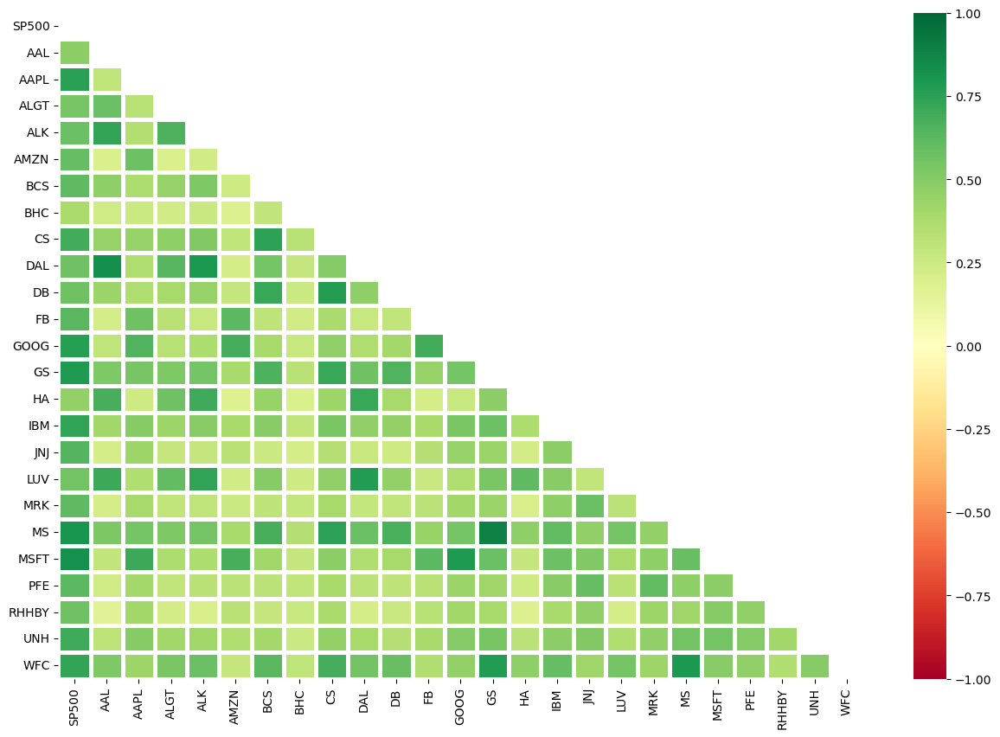

In [39]:
#plotting in a heatmap
plt.figure(figsize=(15,10))
mask = np.zeros_like(corr_df)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corr_df, cmap='RdYlGn', vmax=1.0, vmin=-1.0 , mask = mask, linewidths=2.5)
plt.yticks(rotation=0) 
plt.xticks(rotation=90) 
plt.show()

- The chart above illustrates the correlation between different company stocks, which will assist us in constructing portfolios for our clients.

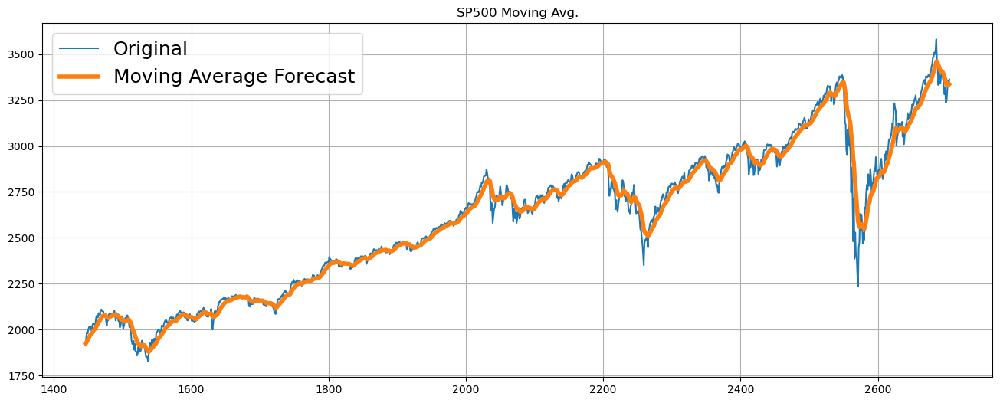

In [40]:
# 14-day moving average
select_stock = 'SP500'
y_hat_avg = df_final.copy()
y_hat_avg['moving_avg_forecast'] = df_final[select_stock].ewm(span=14, adjust=False).mean()

# Plot moving average
plt.figure(figsize=(16,6))
plt.plot(df_final[select_stock], label='Original')
plt.plot(y_hat_avg['moving_avg_forecast'], label='Moving Average Forecast', linewidth=4)
plt.title(select_stock + " Moving Avg.")
plt.grid(True)
plt.legend(loc='best', fontsize=18)
plt.show()

 - The 14 day forecast shows a very similar trend to sp500 trend showing that we can rely on this for future investments.

# Moving Average

In [41]:
fig = go.Figure()

for column in [select_stock, 'moving_avg_forecast',]:
        fig.add_trace(
            go.Scatter(
                x = y_hat_avg.Date,
                y = y_hat_avg[column],
                name = column
            )
            
        )
fig.update_layout(title_text="Moving Average",
                  xaxis_rangeslider_visible=True)
    
fig.show()

 - The moving forecast of our trend has shown an exact similar pattern as S&P500 for the past five years.
     As our initial assumption that the stocks will perform in the same way for the next five years as it has done in the last five years, now we will study about our clients and give them the portfolio according to their goals and risk appetite.

### Applying ARIMA Model to forecast the stocks 

In [47]:
## Test train split
train = df[:900]
test = df[900:]

In [48]:
## Preparing data in Prophet format
train_prophet = train.rename(columns={'Date': 'ds', 'SP500': 'y'})
test_prophet = test.rename(columns={'Date': 'ds', 'SP500': 'y'})


In [49]:
## Fitting Prophet model
model = Prophet()
model.fit(train_prophet)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1


In [50]:
##Make future predictions
future = model.make_future_dataframe(periods=len(test))
forecast = model.predict(future)

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should

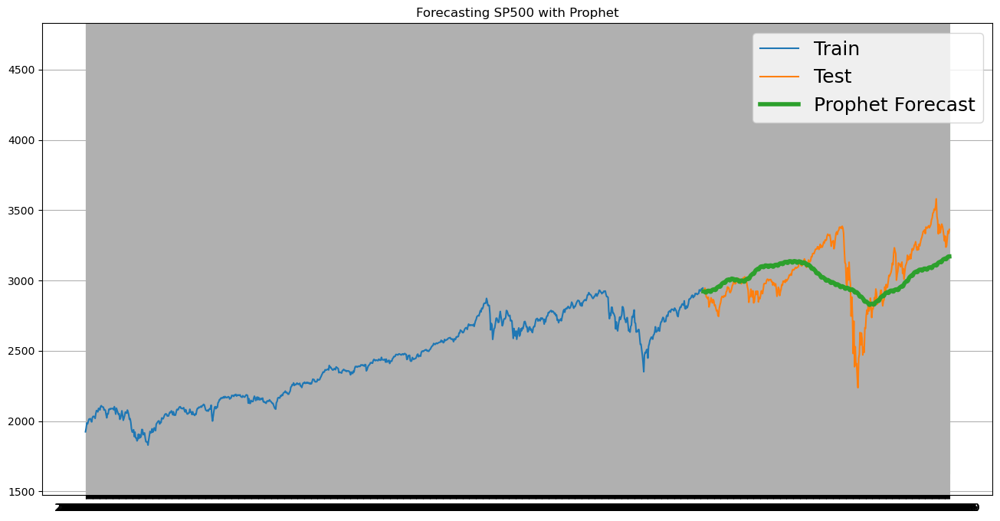

In [51]:
##Plotting the results
plt.figure(figsize=(16, 8))
plt.plot(train['Date'], train['SP500'], label='Train')
plt.plot(test['Date'], test['SP500'], label='Test')
plt.plot(test['Date'], forecast['yhat'][-len(test):], label='Prophet Forecast', linewidth=4)
plt.fill_between(test['Date'].values, y1=forecast['yhat_lower'][-len(test):], y2=forecast['yhat_upper'][-len(test):], alpha=0.4, color='green')
plt.grid(True)
plt.title('Forecasting SP500 with Prophet')
plt.legend(loc='best', fontsize=18)
plt.show()

### Selecting Portfolio

There is a trade off between portfolio risk and return. Therefore by looking at the profiles above we decide the stocks that may be suitable for each investor based on the dispersion/volitility we looked before. 


# Client Profile: Mr. Patrick Jyenger

- Mr. Patrick Jyenger is a conservative investor focused on maintaining a decent standard of living.

- He plans to invest 500,000 dollars for a minority stake and the remaining 500,000 dollars in equities.

- His primary goal is to double his capital with minimal risk over a period of 5 years.

### Portfolio Details:

- We have selected stocks from Microsoft, Merck & Co. Inc., Johnson & Johnson, and Roche Holding AG, all of which have demonstrated favorable returns with relatively low risk.

- The portfolio allocation is as follows: 22.5% in Microsoft, 20% in Merck & Co., 27.5% in Johnson & Johnson, and 30% in Roche Holding AG.

- This selection ensures sector diversification with two stocks from the Healthcare industry, one from Technology, and one from Pharmaceuticals, aiming to reduce overall portfolio volatility.

In [52]:
#We choose the stocks that are more stable based on Corellation, Dispersion and the plots:
stocks = ['MSFT','MRK','JNJ','RHHBY']
initial_weight = np.array([0.9/4,0.8/4,1.1/4,1.2/4])

In [53]:
portfolio=df.copy()
portfolio=portfolio.set_index('Date')
portfolio=portfolio[stocks]

In [54]:
return_stocks = portfolio.pct_change()
return_stocks.tail(10)

,MSFT,MRK,JNJ,RHHBY
Date,,,,
2020-09-17,-0.010436,0.000818,-0.008288,0.007607
2020-09-18,-0.012419,0.001985,0.013658,0.010354
2020-09-21,0.010729,-0.031232,-0.027349,-0.011529
2020-09-22,0.024094,-0.002286,-0.006134,0.000216
2020-09-23,-0.032928,-0.003738,0.001595,-0.031311
2020-09-24,0.012962,0.006293,0.001592,-0.003567
2020-09-25,0.022787,-0.002646,0.006843,0.002685
2020-09-28,0.007795,-0.002050,0.009955,-0.015841
2020-09-29,-0.010409,-0.010391,-0.000340,-0.016776


In [55]:
#Daily Return Avg for each stock
daily_returns_portfolio_mean = return_stocks.mean()
print(daily_returns_portfolio_mean)

MSFT     0.001387
MRK      0.000511
JNJ      0.000451
RHHBY    0.000293
dtype: float64


In [56]:
#total portfolio return
allocated_daily_returns = (initial_weight * daily_returns_portfolio_mean)

portfolio_return = np.sum(allocated_daily_returns)
portfolio_return

0.0006260340597179451

In [57]:
# calculate portfolio daily returns
return_stocks['portfolio_daily_returns'] = return_stocks.dot(initial_weight)
return_stocks

,MSFT,MRK,JNJ,RHHBY,portfolio_daily_returns
Date,,,,,
2015-10-01,NaN,NaN,NaN,NaN,NaN
2015-10-02,0.021520,0.015597,0.008157,0.003010,0.011108
2015-10-05,0.023261,0.021739,0.008836,0.003601,0.013092
2015-10-06,0.002573,-0.027913,-0.014141,0.002691,-0.008085
2015-10-07,0.001069,0.023092,0.016699,-0.029228,0.000683
...,...,...,...,...,...
2020-09-24,0.012962,0.006293,0.001592,-0.003567,0.003543
2020-09-25,0.022787,-0.002646,0.006843,0.002685,0.007285
2020-09-28,0.007795,-0.002050,0.009955,-0.015841,-0.000671


In [58]:
#cumulative returns of the portfolio
Cumulative_returns_daily = (1+return_stocks).cumprod()
Cumulative_returns_daily.tail(5)

,MSFT,MRK,JNJ,RHHBY,portfolio_daily_returns
Date,,,,,
2020-09-24,4.554808,1.684221,1.552753,1.345575,2.025902
2020-09-25,4.658597,1.679765,1.563379,1.349187,2.040661
2020-09-28,4.694911,1.676322,1.578942,1.327815,2.039292
2020-09-29,4.646043,1.658902,1.578405,1.305539,2.019823
2020-09-30,4.714862,1.680170,1.597939,1.288682,2.030784


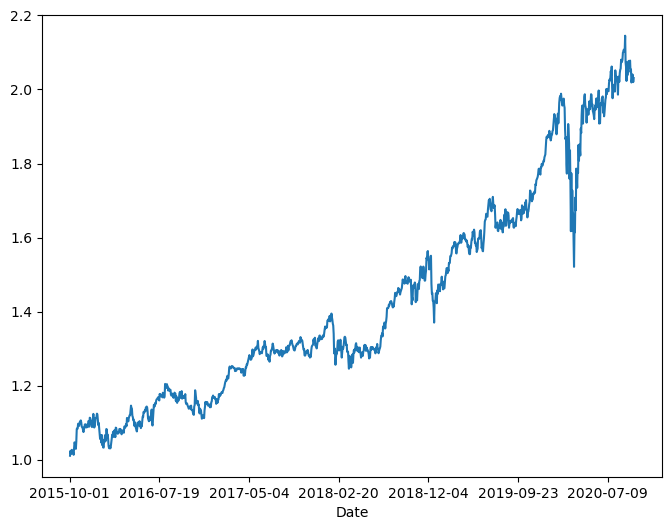

In [59]:
plt.figure(figsize=(8,6))
Cumulative_returns_daily['portfolio_daily_returns'].plot();

- The above portfolio promises a return of 103% over the next 5 years which fullfils the purpose for Mr. Patrick Jyenger.

In [60]:
#portfolio Risk
matrix_covariance_portfolio = return_stocks.iloc[:,:-1]
matrix_covariance_portfolio = (matrix_covariance_portfolio.cov())*252*5

matrix_covariance_portfolio

,MSFT,MRK,JNJ,RHHBY
MSFT,0.387618,0.146870,0.141386,0.148982
MRK,0.146870,0.249327,0.129221,0.101532
JNJ,0.141386,0.129221,0.195587,0.097800
RHHBY,0.148982,0.101532,0.097800,0.230116


In [61]:
portfolio_variance = np.dot(initial_weight.T,np.dot(matrix_covariance_portfolio, initial_weight))

#standard deviation (risk of portfolio)
portfolio_risk = np.sqrt(portfolio_variance)
portfolio_risk

0.3980707906158959

- The risk associated with the above portfolio is 39.8% making it a low-risk portfolio

# Client Profile: Mr. Peter Jyenger

- Mr. Peter Jyenger is a risk-tolerant investor known for his consistent appetite for risk.

- He plans to invest 1 million dollars in high-margin stocks.

- His primary objective is to achieve very high returns over a 5-year period.

## Portfolio Details:

- We have selected stocks from Amazon, Facebook, Google, Apple, Morgan Stanley, and Microsoft, all known for their high returns but also accompanied by high risk.

- The portfolio allocation is as follows: 18.33% in Amazon, 20% in Facebook, 21.7% in Google, 11.7% in Apple, 13.3% in Morgan Stanley, and 15% in Microsoft.

- This allocation strategy aims to maximize potential returns while considering the higher risk associated with these stocks.

In [62]:
#We choose the stocks that have highest return 
stocks = ['AMZN','FB','GOOG','AAPL','MS','MSFT']
initial_weight = np.array([1.1/6,1.2/6,1.3/6,0.7/6,0.8/6,0.9/6])

In [63]:
portfolio=df.copy()
portfolio=portfolio.set_index('Date')
portfolio=portfolio[stocks]

In [64]:
return_stocks = portfolio.pct_change()
return_stocks.tail(10)

,AMZN,FB,GOOG,AAPL,MS,MSFT
Date,,,,,,
2020-09-17,-0.022537,-0.033015,-0.016681,-0.015964,-0.017595,-0.010436
2020-09-18,-0.017888,-0.008987,-0.023764,-0.031720,-0.003383,-0.012419
2020-09-21,0.001882,-0.017344,-0.019747,0.030326,-0.034345,0.010729
2020-09-22,0.056923,0.026597,0.023967,0.015716,-0.015095,0.024094
2020-09-23,-0.041269,-0.022493,-0.034290,-0.041946,-0.025404,-0.032928
2020-09-24,0.006644,0.002048,0.009242,0.010269,0.004093,0.012962
2020-09-25,0.024949,0.021200,0.011671,0.037516,0.009225,0.022787
2020-09-28,0.025498,0.007849,0.013537,0.023869,0.028486,0.007795
2020-09-29,-0.009190,0.019352,0.003284,-0.007568,-0.023563,-0.010409


In [65]:
#Daily Return Avg for each stock
daily_returns_portfolio_mean = return_stocks.mean()
print(daily_returns_portfolio_mean)

AMZN    0.001611
FB      0.001050
GOOG    0.000834
AAPL    0.001322
MS      0.000578
MSFT    0.001387
dtype: float64


In [66]:
#total portfolio return
allocated_daily_returns = (initial_weight * daily_returns_portfolio_mean)

portfolio_return = np.sum(allocated_daily_returns)
portfolio_return

0.00112523713880419

In [67]:
# calculate portfolio daily returns
return_stocks['portfolio_daily_returns'] = return_stocks.dot(initial_weight)
return_stocks

,AMZN,FB,GOOG,AAPL,MS,MSFT,portfolio_daily_returns
Date,,,,,,,
2015-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-10-02,0.022699,0.012314,0.025553,0.007301,-0.002222,0.021520,0.015944
2015-10-05,0.020919,0.021071,0.023225,0.003624,0.027362,0.023261,0.020642
2015-10-06,-0.011404,-0.012871,0.006189,0.004784,0.002168,0.002573,-0.002091
2015-10-07,0.008298,-0.004310,-0.004772,-0.004761,0.017614,0.001069,0.001579
...,...,...,...,...,...,...,...
2020-09-24,0.006644,0.002048,0.009242,0.010269,0.004093,0.012962,0.007318
2020-09-25,0.024949,0.021200,0.011671,0.037516,0.009225,0.022787,0.020368
2020-09-28,0.025498,0.007849,0.013537,0.023869,0.028486,0.007795,0.016930


In [68]:
#cumulative returns of the portfolio
Cumulative_returns_daily = (1+return_stocks).cumprod()
Cumulative_returns_daily.tail(5)

,AMZN,FB,GOOG,AAPL,MS,MSFT,portfolio_daily_returns
Date,,,,,,,
2020-09-24,5.799259,2.743595,2.336518,3.950356,1.479683,4.554808,3.394295
2020-09-25,5.943943,2.801759,2.363788,4.098558,1.493333,4.658597,3.463429
2020-09-28,6.095503,2.823749,2.395786,4.196386,1.535873,4.694911,3.522063
2020-09-29,6.039484,2.878395,2.403655,4.164628,1.499683,4.646043,3.512593
2020-09-30,6.046878,2.879604,2.404096,4.227414,1.534921,4.714862,3.538803


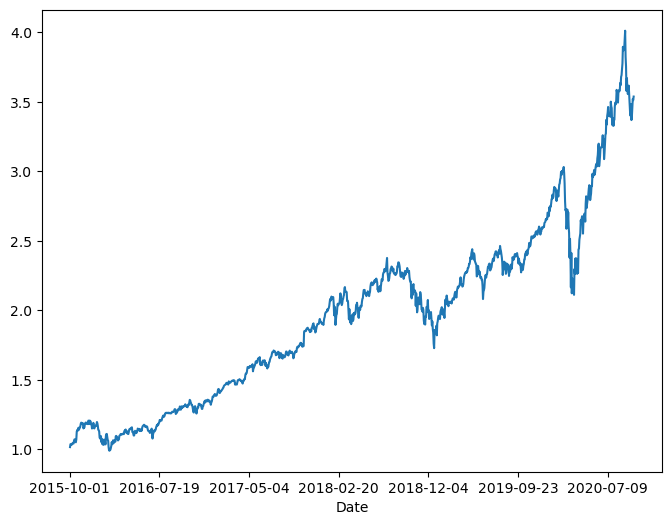

In [69]:
plt.figure(figsize=(8,6))
Cumulative_returns_daily['portfolio_daily_returns'].plot();

- The above portfolio promises a return of 250% over the next 5 years which fullfils the purpose for Mr. Peter Jyenger.

In [71]:
#Portfolio Risk
matrix_covariance_portfolio = return_stocks.iloc[:,:-1]
matrix_covariance_portfolio = (matrix_covariance_portfolio.cov())*252*5

matrix_covariance_portfolio

,AMZN,FB,GOOG,AAPL,MS,MSFT
AMZN,0.453356,0.301423,0.269533,0.257986,0.201473,0.283129
FB,0.301423,0.522010,0.293674,0.271396,0.245121,0.279961
GOOG,0.269533,0.293674,0.343883,0.255345,0.249469,0.285552
AAPL,0.257986,0.271396,0.255345,0.441988,0.284439,0.291752
MS,0.201473,0.245121,0.249469,0.284439,0.599325,0.286097
MSFT,0.283129,0.279961,0.285552,0.291752,0.286097,0.387618


In [72]:
portfolio_variance = np.dot(initial_weight.T,np.dot(matrix_covariance_portfolio, initial_weight))

#standard deviation (risk of portfolio)
portfolio_risk = np.sqrt(portfolio_variance)
portfolio_risk

0.5495494450789262

- The risk associated with the above portfolio is 54.9% making it a high-risk portfolio